# Roget's Thesaurus in the 21st Century

---

> Marsid Mali<br />
> Department of Management Science and Technology <br />
> Athens University of Economics and Business <br />
> t8200226@aueb.gr

The first known thesaurus was written in the 1st century CE by [Philo of Byblos](https://en.wikipedia.org/wiki/Philo_of_Byblos); it was called *Περὶ τῶν διαφόρως σημαινομένων*, loosly translated in English as *On Synonyms*. Fast forward about two millenia and we arrive to the most well known thesaurus, compiled by [Peter Mark Roget](https://en.wikipedia.org/wiki/Peter_Mark_Roget), a British physician, natural theologian, and lexicographer. [Roget's Thesaurus](https://en.wikipedia.org/wiki/Roget%27s_Thesaurus) was released on 29 April 1852, containing 15,000 words. Subsequent editions were larger, with the latest totalling 443,000 words. In Greek the most well known thesaurus, *Αντιλεξικόν ή Ονομαστικόν της Νεοελληνικής Γλώσσης* was released in 1949 by [Θεολόγος Βοσταντζόγλου](https://el.wikipedia.org/wiki/%CE%98%CE%B5%CE%BF%CE%BB%CF%8C%CE%B3%CE%BF%CF%82_%CE%92%CE%BF%CF%83%CF%84%CE%B1%CE%BD%CF%84%CE%B6%CF%8C%CE%B3%CE%BB%CE%BF%CF%85); the latest updated edition was released in 2008 and remains an indispensable source for writing in Greek.

Roget organised the entries of the thesaurus in a hierarchy of categories. In this assignment we investigate how these categories fare with the meaning of English words as captured by Machine Learning techniques, namely, their embeddings.

## Get Roget's Thesaurus Classification

*You can find [Roget's Thesaurus classification online at the Wikipedia](https://en.wiktionary.org/wiki/Appendix:Roget%27s_thesaurus_classification). You must download the categorisation (and the words belonging in each category), save them and store them in the way that you deem most convenient for processing.*

In [1]:
import requests
from bs4 import BeautifulSoup
import json
import pandas as pd
from utils.thesaurus_parser import parser

response = requests.get("https://www.gutenberg.org/files/10681/old/20040627-10681-h-body-pos.htm")
html_content = response.text
soup = BeautifulSoup(html_content, "html.parser")
clean_text = soup.get_text()
clean_text_lines = clean_text.split('\n')
df = parser(clean_text_lines)
print(df.shape)
df.head(11)

(99058, 7)


,Class,Division/Section,Section,Subsection,Concept,Category,Term
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,existence
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,being
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,entity
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,ens
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,esse
5,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,subsistence
6,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,reality
7,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,actuality
8,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,positiveness
9,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,fact


- **Class**: This column represents the top-level categorization within Roget's Thesaurus, organizing terms into one of six broad classes. Each class encapsulates a wide range of concepts under a general thematic domain. 


- **Division/Section**: This column shows more specific categorizations within each class. If a class is subdivided into divisions, this column will list the name of the division. If the class does not have divisions but is directly divided into sections, this column will display the section name instead. 


- **Section**: The handling of this column depends on the structure of the class: a) If a class is divided into divisions, this column lists the sections within those divisions, providing details on the specific areas of focus within the division. 
b) If a class does not have divisions and is organized directly into sections, the "Section" column will mirror the "Division/Section" column, indicating that the categorization at this level is directly under the class without further divisional subdivision.


- **Subsection**: Subsections provide an even more granular categorization within a section. They help to organize concepts into subcategories that share more specific commonalities. 


- **Concept**: This column indicates the conceptual category under which terms are grouped within the subsection. It directly relates to the thematic focus of the subsection, providing a label that summarizes the shared concept of the listed terms. 


- **Category**: The "Category" column specifies the grammatical category of the terms listed, such as noun, verb, adjective, etc. 

- **Term**: Finally, the "Term" column lists the individual words or phrases that are categorized under the previously mentioned hierarchical structure. 

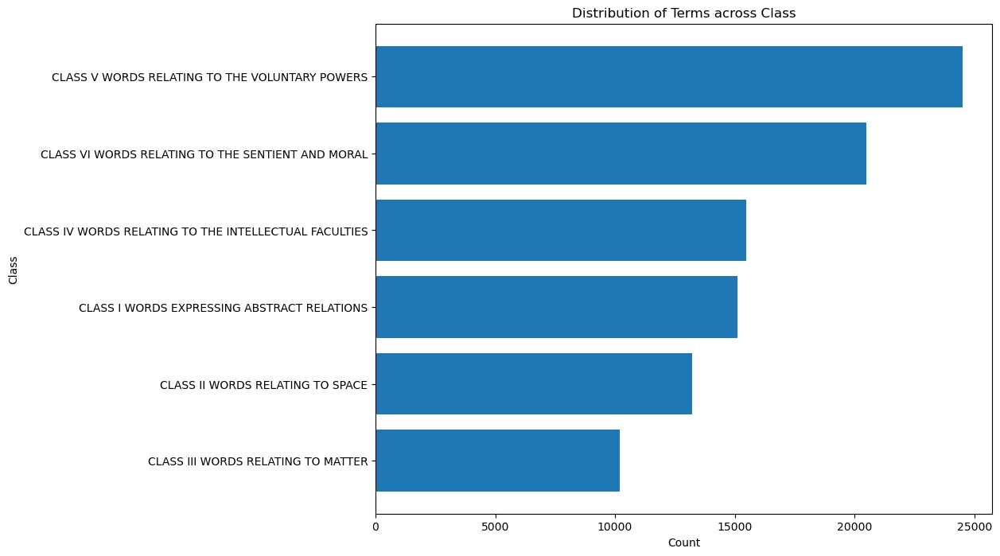

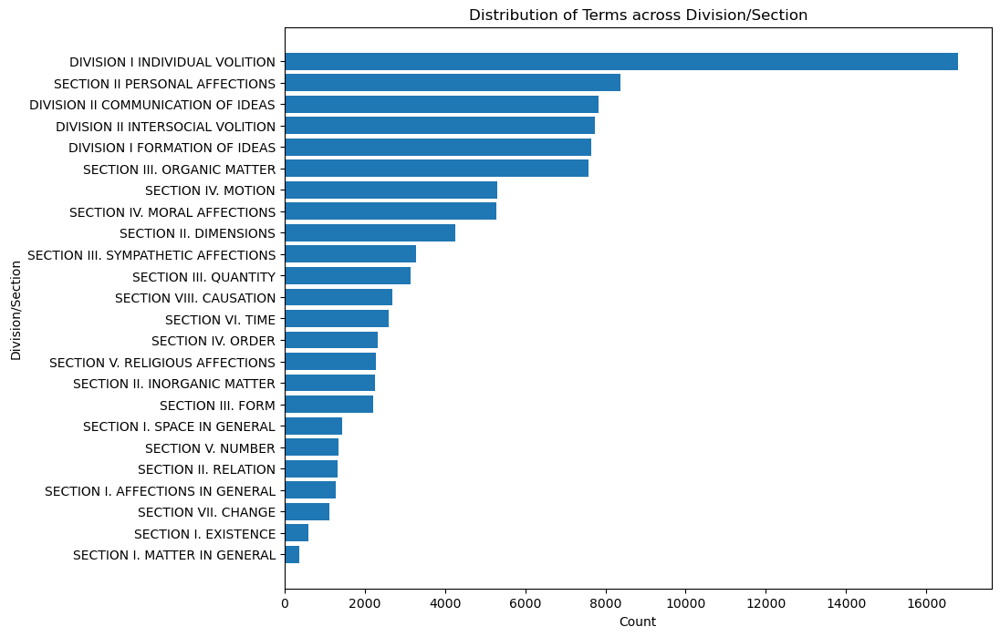

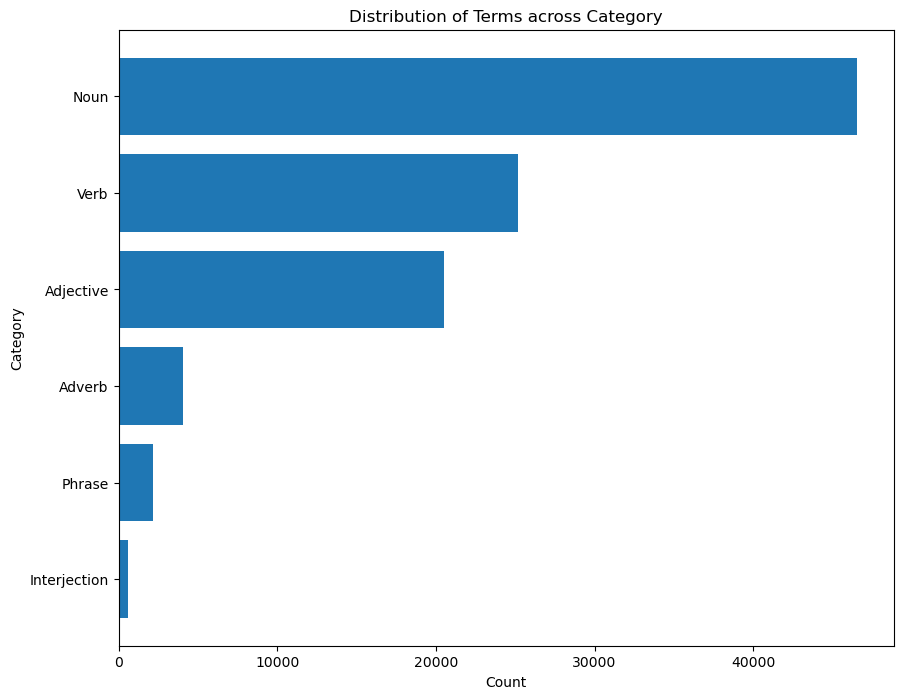

In [2]:
import matplotlib.pyplot as plt

for column in ['Class', 'Division/Section', 'Category']:
    sorted_terms = df[column].value_counts().sort_values(ascending=False).reset_index()
    sorted_terms.columns = [column, 'Count']

    plt.figure(figsize=(10, 8))
    plt.barh(sorted_terms[column], sorted_terms['Count'])
    plt.xlabel('Count')
    plt.ylabel(column)
    plt.title(f'Distribution of Terms across {column}')
    plt.gca().invert_yaxis()  
    plt.show()

- **Class Distribution**: The variance in term counts across different classes, with "CLASS V" having the highest number of terms (24,516) and "CLASS III" the lowest (10,212), indicates a significant imbalance. The focus is heavily skewed towards voluntary powers and sentient and moral aspects, suggesting a richer vocabulary or greater lexical diversity in these areas compared to others like physical matter.

- **Division/Section Distribution**: Similarly, the "Division/Section" distribution shows a pronounced imbalance. Some divisions/sections, such as "INDIVIDUAL VOLITION" and "PERSONAL AFFECTIONS", are significantly more populated than others, like "MATTER IN GENERAL" or "EXISTENCE".

- **Category Distribution** : As we see nouns overwhelmingly dominate the dataset (46,511 terms), followed by verbs (25,200 terms), and adjectives (20,528 terms). Adverbs, phrases, and interjections are far less represented. 

# Rethinking Widely Used Preprocessing Practices in Word Embeddings
While there are widely used preprocessing practices in the preparation of text for word embeddings, such as removing punctuation, converting to lowercase, tokenizing and exploding phrases, and removing stop words, we consciously chose not to employ these techniques. This decision stems from a nuanced understanding of the intricate ways in which these textual elements contribute to the richness and complexity of language, as well as the specific requirements of our project that necessitate a departure from these conventions.

1. **Not Removing Punctuation**:
Punctuation marks are integral to conveying the structure, tone, and nuances of language. They indicate pauses, emphasize certain points, and differentiate between sentence types (e.g., statements vs. questions). By preserving punctuation, we aim to retain these subtle cues that could be critical for certain tasks.

2. **Maintaining Original Case**:
Case sensitivity plays a crucial role in distinguishing between proper nouns and common nouns, and in some instances, can change the meaning of a word entirely (e.g., "Polish" vs. "polish"). By keeping the original casing, we preserve this distinction, recognizing that such differentiation can enhance the semantic accuracy of our embeddings.

3. **Avoiding Tokenization and Phrase Explosion**:
Tokenizing and exploding phrases into individual words can disrupt the integrity of idiomatic expressions or compound nouns, which carry meanings that are not discernible from their constituent parts. By maintaining these phrases intact, we ensure that our embeddings can accurately capture the context and semantic relationships within the text. 

4. **Retaining Stop Words**:
Stop words, often deemed as noise in many NLP tasks, actually play a significant role in providing grammatical structure and sometimes carry semantic weight in a sentence. By choosing not to remove stop words, we aim to preserve the full textual context, allowing our embeddings to capture more nuanced syntactic and semantic relationships. 

In making these choices, we acknowledge the challenges posed by increased computational complexity and the potential for noise in our embeddings. However, we believe that the benefits of a more nuanced and contextually rich representation of text outweigh these concerns, particularly for applications where the subtleties of language are crucial for performance. This approach requires careful consideration and sophisticated handling of text data but ultimately aims to create embeddings that more accurately reflect the complexities of human language.

Now given that our dataset is relatively large, generating embeddings for every single term might be resource-intensive and time-consuming. To mitigate this, we'll perform a deduplication step.

In [3]:
unique_df = df.drop_duplicates(subset=['Term'])
unique_terms = unique_df['Term'].tolist()
print(f"Unique terms: {len(unique_terms)}")
print(f"{len(df) - len(unique_terms)} embedding generations fewer")

Unique terms: 59625
39433 embedding generations fewer


## Get Word Embeddings

*You will embeddings for the word entries in Roget's Thesaurus. It is up to you to find the embeddings; you can use any of the available models. Older models like word2vec, GloVe, BERT, etc., may be easier to use, but recent models like Llama 2 and Mistral have been trained on larger corpora. OpenAI and Google offer their embeddings through APIs, but they are not free.*

*You should think about how to store the embeddings you retrieve. You may use plain files (e.g., JSON, CSV) and vanilla Python, or a vector database.*

Now that we've efficiently preprocessed our dataset and saved ourselves the task of generating nearly 40,000 embeddings, it's time to move on to generating the embeddings for the unique terms. These embeddings will be stored in a dictionary, allowing us to map the embedding vectors to all terms in our dataset easily. To achieve this, we've utilized the OpenAI API, specifically opting for the large model which provides us with embeddings of 3072 dimensions per term. This high dimensionality ensures a rich representation of each term's semantic properties.

In [4]:
"""from openai import OpenAI
from utils.parallelized_embeddings_fetcher import fetch_embeddings_with_rate_limit,store_embeddings_in_chunks,read_embeddings

client = OpenAI(api_key='YOUR-API-KEY') 

term_embedding_map = fetch_embeddings_with_rate_limit(client, unique_terms, model='text-embedding-3-large', requests_per_minute=2900, batch_size=100)
store_embeddings_in_chunks(term_embedding_map)"""

In case you do not have access to an OpenAI API key or prefer not to generate embeddings afresh, an alternative has been provided. The read_embeddings() method is available to load pre-generated embeddings that are stored in a json file.

In [6]:
from utils.parallelized_embeddings_fetcher import read_embeddings

term_embedding_map =  read_embeddings()
len(term_embedding_map['existence'])

3072

With the embeddings map in hand, let's proceed to map these embeddings to all the terms in our dataset. 

In [7]:
df['embedding'] = df['Term'].apply(lambda x: term_embedding_map.get(x, None))
df.head(3)

,Class,Division/Section,Section,Subsection,Concept,Category,Term,embedding
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,existence,"[-0.010458147153258324, 0.0020530542824417353,..."
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,being,"[0.004396131262183189, 0.011118619702756405, 0..."
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,SECTION I. EXISTENCE,SECTION I. EXISTENCE,"1. BEING, IN THE ABSTRACT",1. Existence,Noun,entity,"[-0.019387325271964073, -0.011217557825148106,..."


In [7]:
none_embeddings = df[df['embedding'].isnull()]
print(f"Number of terms without embedding: {none_embeddings.shape[0]}")

Number of terms without embedding: 0


As we observe, the embedding model has successfully produced embeddings for all of our terms, providing us with a rich, multidimensional representation of our dataset's vocabulary. 

## Clustering

*With the embeddings at hand, you can check whether unsupervised Machine Learning methods can arrive at classifications that are comparable to the Roget's Thesaurus Classification. You can use any clustering method of your choice (experiment freely). You must decide how to measure the agreement between the clusters you find and the classes defined by Roget's Thesaurus and report your results accordingly. The comparison will be at the class level (six classes) and the section / division level (so there must be two different clusterings, unless you can find good results with hierarchical clustering).*

Since our word embeddings have 3072 dimensions for our tasks, we will apply PCA to reduce the dimensionality. Let's visualize the variance explained by each principal component,and decide how many principal components to retain based on the cumulative explained variance.

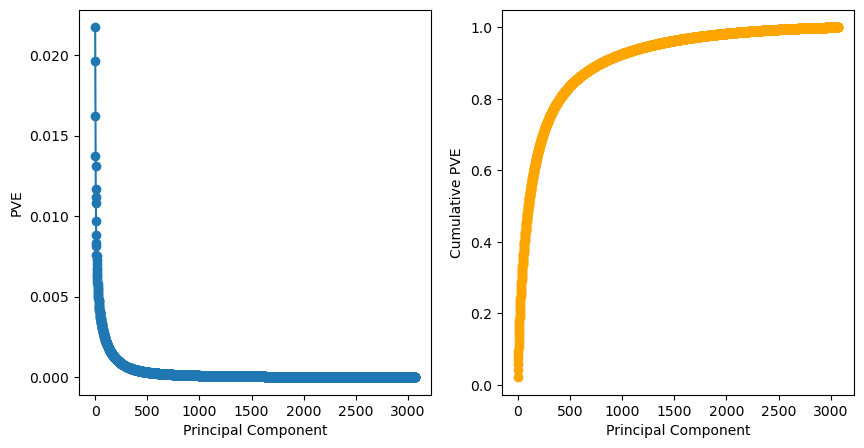

In [23]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA()
X = pca.fit_transform(np.vstack(df['embedding'].values))
print(X.shape)
pca.explained_variance_ratio_
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.plot(pca.explained_variance_ratio_, marker='o')
plt.xlabel('Principal Component')
plt.ylabel('PVE')
plt.subplot(1, 2, 2)
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='orange')
plt.xlabel('Principal Component')
_ = plt.ylabel('Cumulative PVE')

After applying PCA, we observe an elbow in the scree plot at around 350 components, where almost 80% of the variance is explained.Based on this we will do PCA using 350 dimensions also despite the fact that word embeddings are already scaled, we will further apply Standard Scaling to the reduced dataset. 

In [8]:
from sklearn.preprocessing import StandardScaler
pca = PCA(n_components=350)
matrix_reduced = pca.fit_transform(np.vstack(df['embedding'].values))
scaler = StandardScaler()
matrix_reduced = scaler.fit_transform(matrix_reduced)

Now we do KMeans clustering on our reduced data.

In [9]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=6, random_state=42, n_init=20)   
cluster_labels = kmeans.fit_predict(pca_result)
df["Cluster"] = cluster_labels

Lets see the identified clusters using PCA with:
- 2 Dimensions

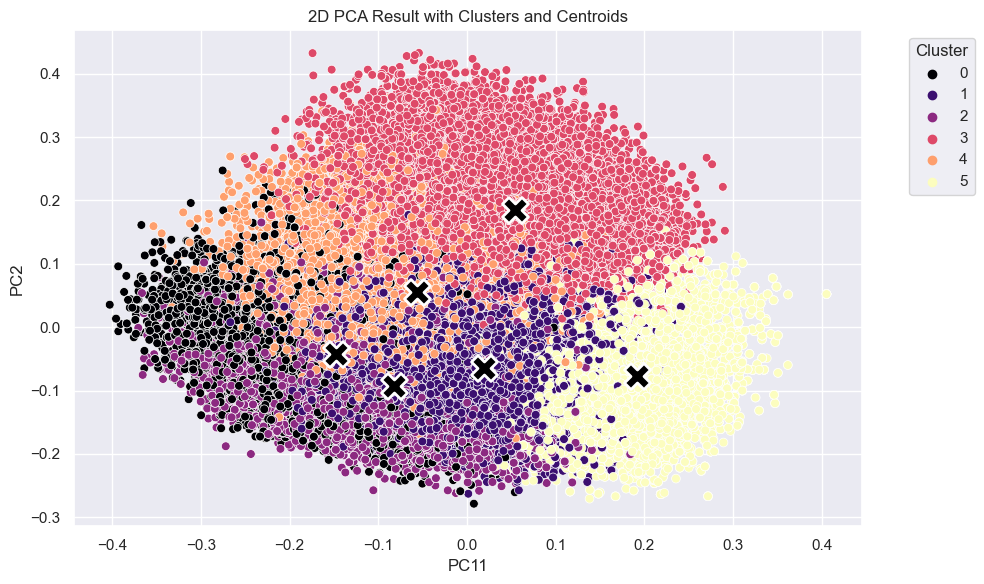

In [13]:
import seaborn as sns

pca = PCA(n_components=2)
pca_result1 = pca.fit_transform(np.vstack(df['embedding'].values))
df1 = pd.DataFrame(pca_result1, columns=['PC1', 'PC2'])
df1['Cluster'] = cluster_labels
sns.set()
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df1, x='PC1', y='PC2', hue='Cluster', palette='magma', s=40, alpha=1)

# Calculate and plot centroids
for cluster in df1['Cluster'].unique():
    centroid = df1[df1['Cluster'] == cluster][['PC1', 'PC2']].mean()
    plt.scatter(centroid['PC1'], centroid['PC2'], marker='X', color='black', s=350, edgecolor='white', linewidth=2)
    
plt.title('2D PCA Result with Clusters and Centroids')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

- and 3 Dimensions

In [81]:
import plotly.graph_objects as go

pca = PCA(n_components=3)
pca_result1 = pca.fit_transform(np.vstack(df['embedding'].values))
df1 = pd.DataFrame(pca_result1, columns=['PC1', 'PC2','PC3'])
df1['Cluster'] = cluster_labels

fig = go.Figure()
for cluster in df1['Cluster'].unique():
    cluster_df = df1[df1['Cluster'] == cluster]
    fig.add_trace(go.Scatter3d(x=cluster_df['PC1'], y=cluster_df['PC2'], z=cluster_df['PC3'],mode='markers',
        marker=dict(size=5), name=f'Cluster {cluster}'))

fig.update_layout(
    title={'text': "3D PCA Result with Clusters",'x':0.5, 'xanchor': 'center', 'yanchor': 'top'},
    scene=dict(xaxis_title='PC1', yaxis_title='PC2', zaxis_title='PC3'),
    margin=dict(l=0, r=0, b=0, t=50),  
    width=800,  
    height=600,  
)
fig.show()

To analyze the alignment between the clusters generated by our model and the Actual classes within our dataset we will construct a contingency matrix that cross-tabulates the occurrences of classes within each cluster. 

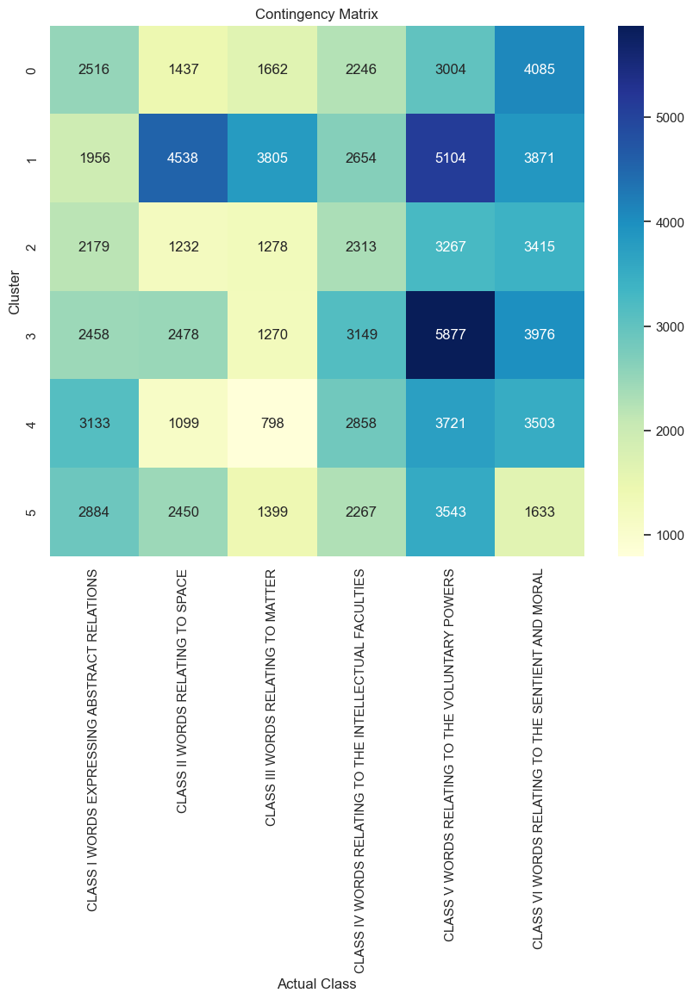

In [82]:
contingency_matrix = pd.crosstab(df['Cluster'], df['Class'])

plt.figure(figsize=(10, 8))
sns.heatmap(contingency_matrix, annot=True, cmap='YlGnBu', fmt='g')
plt.xlabel('Actual Class')
plt.ylabel('Cluster')
plt.title('Contingency Matrix')
plt.show()

To evaluate the quality of the clustering by measuring the extent to which clusters contain a single class we wiil also  calculate purity which is the ratio of the total number of correctly assigned items to the cluster size. A higher purity value indicates a better clustering outcome, where each cluster predominantly contains elements from a single class.

In [83]:
def calculate_purity(contingency_matrix):
    cluster_purity = np.sum(np.max(contingency_matrix.values, axis=1))
    purity = cluster_purity / np.sum(contingency_matrix.values)
    return purity

purity = calculate_purity(contingency_matrix)
print(f"Purity: {purity}")

Purity: 0.25989824143431123


The calculated purity score of approximately **0.26** suggests that the clusters formed, exhibit a moderate level of alignment with the actual classes. However, the relatively low purity indicates a significant overlap of classes within clusters. This outcome could imply two main points: firstly, that the clustering method, while capturing some of the inherent groupings within the data, may not be perfectly distinguishing between the nuanced differences across classes. Secondly, and importantly, it reflects the inherent complexity and potential ambiguity in classifying the word embeddings from the thesaurus.

If we try to match each cluster to a unique class, ensuring that no two clusters are matched to the same class, especially in an imbalanced dataset like ours we should try solving this problem as an optimization problem. A popular algorithm for solving such problems is the Hungarian algorithm, also known as the Kuhn-Munkres algorithm. It finds the optimal one-to-one matching between clusters and classes based on a cost matrix. In our case, the cost could be defined as the negative of the number of points in a cluster that belong to a class, or inversely proportional to the size of the intersection between cluster and class, to handle imbalance.

To adapt this algorithm for our purpose, we first use the contingency matrix that counts the occurrences of each class within each cluster. Since the Hungarian algorithm is designed to minimize costs, we transform our problem into a minimization task by negating the contingency matrix, effectively treating higher counts (which indicate a stronger association between a cluster and a class) as lower "costs."

In [85]:
from scipy.optimize import linear_sum_assignment

cost_matrix = -contingency_matrix.to_numpy()
# Apply the Hungarian algorithm to find the optimal assignment
row_ind, col_ind = linear_sum_assignment(cost_matrix)

After applying the Hungarian algorithm, we map the optimal cluster-to-class assignments and calculate a similarity metric for each pairing. This similarity metric quantifies the proportion of points in each cluster that belong to its assigned class, providing a clear measure of how well each cluster represents its corresponding class.

In [86]:
# Mapping the results back to cluster labels and class names
cluster_to_class = {cluster: contingency_matrix.columns[class_idx] for cluster, class_idx in zip(contingency_matrix.index[row_ind], col_ind)}

# Calculate similarity metric for each cluster-class assignment
similarity_metrics = {}
total_points_in_cluster = contingency_matrix.sum(axis=1)
for cluster, class_name in cluster_to_class.items():
    # Number of points in the cluster that belong to the assigned class
    points_in_assigned_class = contingency_matrix.loc[cluster, class_name]
    # Calculate the similarity as the proportion of points in the cluster that belong to the assigned class
    similarity = points_in_assigned_class / total_points_in_cluster[cluster]
    similarity_metrics[cluster] = similarity

print("Cluster to Class Assignments with Similarity:")
for cluster, class_name in cluster_to_class.items():
    print(f"Cluster {cluster} -> Class {class_name}: Similarity = {similarity_metrics[cluster]:.2f}")

Cluster to Class Assignments with Similarity:
Cluster 0 -> Class CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL: Similarity = 0.27
Cluster 1 -> Class CLASS III WORDS RELATING TO MATTER: Similarity = 0.17
Cluster 2 -> Class CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES: Similarity = 0.17
Cluster 3 -> Class CLASS V WORDS RELATING TO THE VOLUNTARY POWERS: Similarity = 0.31
Cluster 4 -> Class CLASS I WORDS EXPRESSING ABSTRACT RELATIONS: Similarity = 0.21
Cluster 5 -> Class CLASS II WORDS RELATING TO SPACE: Similarity = 0.17


Then we refine our evaluation of cluster-to-class alignment by incorporating more sophisticated metrics: precision, recall, and the F1 score. These metrics offer a more detailed assessment of the clustering performance, beyond the initial similarity metric, by taking into account the accuracy and completeness of our cluster-to-class assignments.

In [87]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Ensure the 'ActualClass' column is treated as categorical
df['ActualClass'] = df['Class'].astype('category')

# Calculate the contingency matrix
contingency_matrix = pd.crosstab(df['Cluster'], df['ActualClass'])

# Convert the problem to maximization by negating the contingency matrix
cost_matrix = -contingency_matrix.values

# Apply the Hungarian algorithm to find the optimal assignment
row_ind, col_ind = linear_sum_assignment(cost_matrix)

# Ensure the 'ActualClass' column is coded as integers
true_labels_mapped = df['ActualClass'].cat.codes

# Prepare the predicted labels mapped to the actual class codes
predicted_labels_mapped = df['Cluster'].replace(dict(zip(row_ind, col_ind)))
predicted_labels_mapped = predicted_labels_mapped.map(dict(zip(col_ind, true_labels_mapped.unique())))

# Calculate metrics
precision = precision_score(true_labels_mapped, predicted_labels_mapped, average=None, labels=np.unique(true_labels_mapped), zero_division=0)
recall = recall_score(true_labels_mapped, predicted_labels_mapped, average=None, labels=np.unique(true_labels_mapped))
f1 = f1_score(true_labels_mapped, predicted_labels_mapped, average=None, labels=np.unique(true_labels_mapped))

# Display the results
for cluster, class_idx in zip(row_ind, col_ind):
    class_name = df['ActualClass'].cat.categories[class_idx]
    print(f"Cluster {cluster} -> '{class_name}': Precision = {precision[class_idx]:.2f}, Recall = {recall[class_idx]:.2f}, F1 Score = {f1[class_idx]:.2f}")


Cluster 0 -> 'CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL': Precision = 0.12, Recall = 0.08, F1 Score = 0.09
Cluster 1 -> 'CLASS III WORDS RELATING TO MATTER': Precision = 0.09, Recall = 0.13, F1 Score = 0.11
Cluster 2 -> 'CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES': Precision = 0.16, Recall = 0.20, F1 Score = 0.18
Cluster 3 -> 'CLASS V WORDS RELATING TO THE VOLUNTARY POWERS': Precision = 0.25, Recall = 0.15, F1 Score = 0.19
Cluster 4 -> 'CLASS I WORDS EXPRESSING ABSTRACT RELATIONS': Precision = 0.17, Recall = 0.17, F1 Score = 0.17
Cluster 5 -> 'CLASS II WORDS RELATING TO SPACE': Precision = 0.21, Recall = 0.34, F1 Score = 0.26


The analysis indicates varying degrees of alignment between clusters and their corresponding predefined classes, with Cluster 5 ('CLASS II WORDS RELATING TO SPACE') demonstrating the most significant alignment and Cluster 3 ('CLASS V WORDS RELATING TO THE VOLUNTARY POWERS') showing notable precision:

- Cluster 5 stands out with the highest recall (0.34) and a solid F1 score (0.26), indicating it is the most successful in capturing and representing its assigned class ('CLASS II WORDS RELATING TO SPACE'). This suggests that this cluster is quite comprehensive, including a significant portion of relevant words, and relatively accurate, with a decent proportion of its words correctly belonging to the class.

- Cluster 3 shows the highest precision (0.25) among all clusters, although its recall is lower (0.15), resulting in an F1 score of 0.19. The high precision indicates that a large proportion of words in this cluster accurately belong to its assigned class ('CLASS V WORDS RELATING TO THE VOLUNTARY POWERS'), making it reliable for identifying words related to voluntary powers, even if it doesn't capture all such words.

Moving on to a more granular level of analysis, we will now focus on the comparison at the Division/Section level within our dataset. 
We will do:
- **Hierarchical Clustering**: For each unique cluster identified previously, we will perform hierarchical clustering on the word embeddings. This step is intended to identify subclusters within each main cluster.

- **Dimensionality Reduction**: Applying PCA to reduce the dimensionality of our embeddings.

- **Optimal Matching**: Using the Hungarian algorithm, we will match the resulting subclusters to the actual division/section labels. This process involves creating a contingency matrix based on the subcluster assignments and division/section labels, then finding the optimal match that minimizes mismatches.

- **Evaluation of Matches**: For each matched pair of subcluster and division/section, we will calculate precision, recall, and F1 scores. These metrics will quantify the accuracy and completeness of our subcluster-to-division/section assignments, providing a clear picture of the clustering effectiveness at this level.

In [88]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.preprocessing import LabelEncoder

# Initialize a list to store the results
results = []

# Perform operations for each unique cluster
unique_clusters = df['Cluster'].unique()
for cluster in unique_clusters:
    # Filter data for the current cluster
    d = df[df['Cluster'] == cluster]
    cluster_data = np.vstack(d['embedding'].values)
    
    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=20)
    reduced_matrix = pca.fit_transform(cluster_data)

    # Perform hierarchical clustering
    Z = linkage(reduced_matrix, 'complete')
    num_clusters = len(d['Division/Section'].unique())
    labels_level_1 = fcluster(Z, t=num_clusters, criterion='maxclust')

    # Encode the original division/section labels
    encoder = LabelEncoder()
    original_labels_level_1 = encoder.fit_transform(d['Division/Section'])
    
    # Create a contingency matrix for the Hungarian algorithm
    contingency_matrix = pd.crosstab(labels_level_1, original_labels_level_1)
    row_ind, col_ind = linear_sum_assignment(-contingency_matrix.values)
    
    # Calculate metrics for each matched pair
    for cluster_idx, division_idx in zip(row_ind, col_ind):
        # Extract the specific cluster and division
        cluster_mask = labels_level_1 == (cluster_idx + 1)  
        division_mask = original_labels_level_1 == division_idx
        
        # Calculate precision, recall, and F1 score
        precision = np.sum(cluster_mask & division_mask) / np.sum(cluster_mask)
        recall = np.sum(cluster_mask & division_mask) / np.sum(division_mask)
        f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
        
        # Append the results including the Class of each Division/Section
        results.append({
            'Cluster': cluster,
            'Class': d[d['Division/Section'] == encoder.inverse_transform([division_idx])[0]]['Class'].iloc[0],  # Get the Class for the division/section
            'Division/Section': encoder.inverse_transform([division_idx])[0],
            'Matched Subcluster': cluster_idx,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        })

results_df = pd.DataFrame(results)
match_filters = [
    (5, "CLASS II WORDS RELATING TO SPACE"),
    (0, "CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL"),
    (1, "CLASS III WORDS RELATING TO MATTER"),
    (2, "CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES"),
    (3, "CLASS V WORDS RELATING TO THE VOLUNTARY POWERS"),
    (4, "CLASS I WORDS EXPRESSING ABSTRACT RELATIONS"),
]

filtered_results = pd.concat(
    [results_df[(results_df.Cluster == cluster) & (results_df.Class == class_name)] for cluster, class_name in match_filters],
    ignore_index=True
)

filtered_results

,Cluster,Class,Division/Section,Matched Subcluster,Precision,Recall,F1 Score
0,5,CLASS II WORDS RELATING TO SPACE,SECTION I. SPACE IN GENERAL,9,0.081169,0.074627,0.077760
1,5,CLASS II WORDS RELATING TO SPACE,SECTION II. DIMENSIONS,10,0.089198,0.132282,0.106549
2,5,CLASS II WORDS RELATING TO SPACE,SECTION III. FORM,12,0.058683,0.135734,0.081940
3,5,CLASS II WORDS RELATING TO SPACE,SECTION IV. MOTION,17,0.236111,0.127957,0.165969
4,0,CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL,SECTION I. AFFECTIONS IN GENERAL,7,0.079279,0.127536,0.097778
5,0,CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL,SECTION II PERSONAL AFFECTIONS,10,0.204595,0.104236,0.138109
6,0,CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL,SECTION IV. MORAL AFFECTIONS,12,0.202020,0.103520,0.136893
7,0,CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL,SECTION III. SYMPATHETIC AFFECTIONS,16,0.121406,0.116386,0.118843
8,0,CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL,SECTION V. RELIGIOUS AFFECTIONS,19,0.109589,0.146789,0.125490
9,1,CLASS III WORDS RELATING TO MATTER,SECTION I. MATTER IN GENERAL,5,0.014085,0.083333,0.024096


Lets do the same process using the actual classes

In [47]:
results = []

# Perform operations for each unique class in 'Cluster'
unique_classes = df['Class'].unique()
for class_name in unique_classes:
    # Filter data for the current class
    d = df[df['Class'] == class_name]
    class_data = np.vstack(d['embedding'].values)
    
    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=20)
    reduced_matrix = pca.fit_transform(class_data)

    # Perform hierarchical clustering
    Z = linkage(reduced_matrix, 'complete')
    num_clusters = len(d['Division/Section'].unique())
    labels_level_1 = fcluster(Z, t=num_clusters, criterion='maxclust')

    # Encode the original division/section labels
    encoder = LabelEncoder()
    original_labels_level_1 = encoder.fit_transform(d['Division/Section'])
    
    # Create a contingency matrix for the Hungarian algorithm
    contingency_matrix = pd.crosstab(labels_level_1, original_labels_level_1)
    row_ind, col_ind = linear_sum_assignment(-contingency_matrix.values)
    
    # Calculate metrics for each matched pair
    for cluster_idx, division_idx in zip(row_ind, col_ind):
        # Extract the specific cluster and division
        cluster_mask = labels_level_1 == (cluster_idx + 1)  # Adjust index to match
        division_mask = original_labels_level_1 == division_idx
        
        # Calculate precision, recall, and F1 score
        precision = np.sum(cluster_mask & division_mask) / np.sum(cluster_mask)
        recall = np.sum(cluster_mask & division_mask) / np.sum(division_mask)
        f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        
        # Append the results
        results.append({
            'Class': class_name,
            'Division/Section': encoder.inverse_transform([division_idx])[0],
            'Matched Subcluster': cluster_idx,  
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        })

# Convert the results to a DataFrame
results_df = pd.DataFrame(results)
results_df

,Class,Matched Subcluster,Division/Section,Precision,Recall,F1 Score
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,1,SECTION II. RELATION,0.143963,0.140377,0.142147
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,2,SECTION I. EXISTENCE,0.039886,0.023333,0.029443
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,3,SECTION IV. ORDER,0.194738,0.339768,0.247577
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,4,SECTION V. NUMBER,0.173375,0.250746,0.205003
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,5,SECTION III. QUANTITY,0.195560,0.204908,0.200124
5,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,6,SECTION VI. TIME,0.483650,0.245087,0.325320
6,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,7,SECTION VII. CHANGE,0.200908,0.158887,0.177444
7,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,8,SECTION VIII. CAUSATION,0.277834,0.206485,0.236904
8,CLASS II WORDS RELATING TO SPACE,1,SECTION III. FORM,0.366854,0.294144,0.326500
9,CLASS II WORDS RELATING TO SPACE,2,SECTION IV. MOTION,0.492365,0.345879,0.406323


There's a noticeable variability in clustering performance across different sections and divisions. For instance, CLASS III WORDS RELATING TO MATTER shows a high performance in SECTION III. ORGANIC MATTER with precision at 0.694, recall at 0.609, and an F1 score of 0.649, indicating a strong alignment between clusters and this specific category.
Some sections, such as SECTION I. SPACE IN GENERAL within CLASS II WORDS RELATING TO SPACE and SECTION I. MATTER IN GENERAL within CLASS III WORDS RELATING TO MATTER, exhibit lower metrics, indicating challenges in accurately clustering words with broad or general meanings. CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES and CLASS V WORDS RELATING TO THE VOLUNTARY POWERS show notable success in certain divisions, such as DIVISION I FORMATION OF IDEAS and DIVISION I INDIVIDUAL VOLITION, respectively, suggesting that the clustering method is particularly effective in these nuanced semantic areas.

## Class Prediction

*Now we flip over to supervised Machine Learning methods. You must experiment and come up with the best classification method, whose input will be a word and its target will be its class, or its section / devision (so there must be two different models).*

For the upcoming classification tasks, we reduce our dataset to 100 components. 

In [11]:
pca = PCA(n_components=100) 
matrix_reduced = pca.fit_transform(np.vstack(df['embedding'].values))
scaler = StandardScaler()
matrix_reduced = scaler.fit_transform(matrix_reduced)

We start with a simple Random Forest model.

In [96]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

X_train, X_test, y_train, y_test = train_test_split(matrix_reduced, df.Class, test_size=0.2, random_state=42)
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

preds = clf.predict(X_test)
report = classification_report(y_test, preds)
accuracy = accuracy_score(y_test, preds)

print(report)
print("Accuracy:", accuracy)

                                                       precision    recall  f1-score   support

          CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.50      0.45      0.47      3029
                     CLASS II WORDS RELATING TO SPACE       0.50      0.47      0.48      2648
                   CLASS III WORDS RELATING TO MATTER       0.52      0.41      0.46      2096
CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.56      0.52      0.54      3161
       CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.49      0.59      0.54      4869
    CLASS VI WORDS RELATING TO THE SENTIENT AND MORAL       0.53      0.56      0.55      4009

                                             accuracy                           0.51     19812
                                            macro avg       0.52      0.50      0.51     19812
                                         weighted avg       0.52      0.51      0.51     19812

Accuracy: 0.5149909145972138


The RandomForest model performance shows moderate effectiveness with an overall accuracy of 51.5%. Here are direct insights based on the provided data:

- Class V (Words relating to the voluntary powers) demonstrates the best balance between precision and recall (0.49 precision, 0.59 recall), leading to the highest f1-score of 0.54. This suggests that the model is most effective in identifying this class among others.

- Class IV (Words relating to the intellectual faculties) also shows a relatively high level of performance with an f1-score of 0.54, backed by a precision of 0.56 and recall of 0.52, indicating that the model is fairly proficient at classifying words in this category.

- Class VI (Words relating to the sentient and moral) is not far behind, with an f1-score of 0.55. This class has a balanced precision and recall (0.53 precision, 0.56 recall), suggesting a good identification rate of relevant cases as well as a moderate level of accuracy in its predictions.

- The model seems to struggle more with Class III (Words relating to matter), which has the lowest f1-score of 0.46. This is due to its lower recall of 0.41, indicating the model misses a significant number of this class's instances.

Across all classes, the model achieves a macro average and weighted average precision, recall, and f1-score around 0.51-0.52, reflecting moderate overall performance. The balanced precision and recall across different classes indicate that the model does not heavily favor precision over recall or vice versa, but the overall figures suggest there's considerable room for improvement in correctly identifying and classifying words across all classes. Lets also see the confusion matrix.

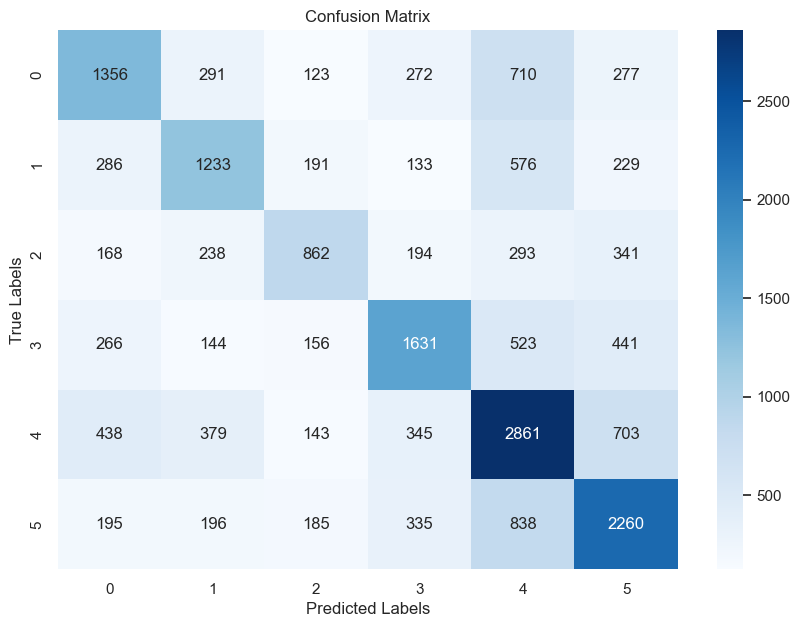

In [98]:
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=True, yticklabels=True)
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.show()
    
plot_confusion_matrix(y_test, preds)

Lets try a simple xgboost model:

In [102]:
import xgboost as xgb

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(df.Class)

X_train, X_test, y_train, y_test = train_test_split(
    matrix_reduced, y_encoded, test_size=0.2, random_state=42
)

xgb_clf = xgb.XGBClassifier(objective='multi:softmax', num_class=6, seed=42)
xgb_clf.fit(X_train, y_train)
y_pred = xgb_clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy*100:.2f}%")
print(classification_report(y_test, y_pred))

Accuracy: 54.94%
              precision    recall  f1-score   support

           0       0.53      0.49      0.51      3029
           1       0.52      0.53      0.52      2648
           2       0.53      0.49      0.51      2096
           3       0.59      0.56      0.57      3161
           4       0.54      0.59      0.56      4869
           5       0.58      0.58      0.58      4009

    accuracy                           0.55     19812
   macro avg       0.55      0.54      0.54     19812
weighted avg       0.55      0.55      0.55     19812



The improved xgboost model has an overall accuracy of 54.94%, indicating a moderate classification performance. It shows relatively consistent precision, recall, and f1-scores across the classes (ranging from 0.51 to 0.58), with Class 3 and Class 5 having slightly better outcomes. Its confusion matrix is: 

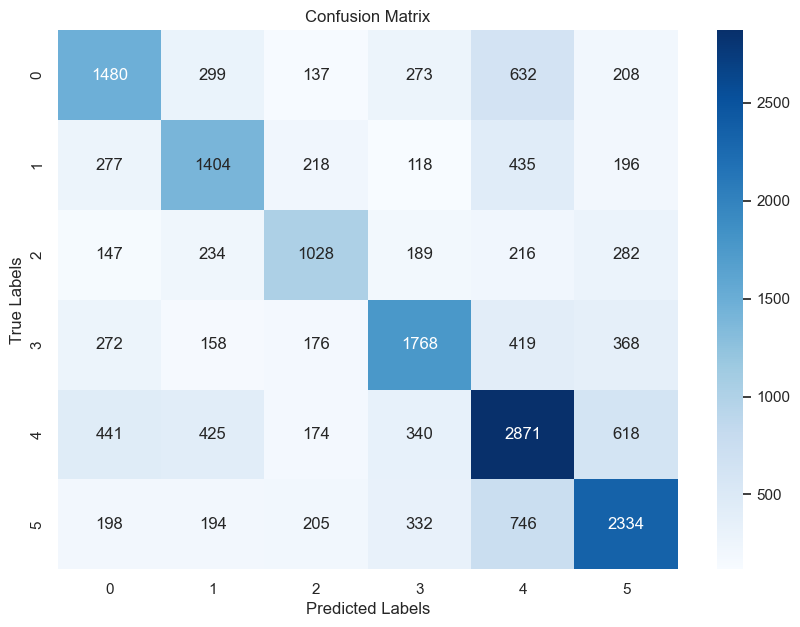

In [103]:
plot_confusion_matrix(y_test, y_pred)

Having seen 2 simple models lets try a more powerful neural network. First things first, let's get our environment ready by importing all the necessary libraries.

In [27]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import tensorflow as tf

We will do One-Hot Encoding on target variable which is required for multiclass classification to work with a softmax output layer.

In [28]:
from tensorflow.keras.utils import to_categorical

y_onehot = to_categorical(y_encoded)

Split the Dataset.

In [29]:
X_train, X_test, y_train, y_test = train_test_split(matrix_reduced, y_onehot, test_size=0.2, random_state=42)

A sequential model is defined with dense layers, batch normalization, and dropout to prevent overfitting. The final layer uses the softmax activation function for our multi-class classification.

In [30]:
model = Sequential([
    Dense(512, activation='relu', input_dim=X_train.shape[1]),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(y_train.shape[1], activation='softmax')
])

The model is compiled with the Adam optimizer, categorical crossentropy as the loss function, and accuracy, precision, and recall as the metrics.

In [31]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

Early stopping and model checkpointing are used to halt training when the validation loss ceases to decrease and save the best model weights, respectively.

In [32]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, save_weights_only=True)

Train and evaluate the Model

In [33]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

model.load_weights('best_model.h5')

results = model.evaluate(X_test, y_test, verbose=0)

print(f'Model Test Loss: {results[0]:.4f}')
print(f'Model Test Accuracy: {results[1] *100:.2f}%')
print(f'Model Test Precision: {results[2]:.4f}')
print(f'Model Test Recall: {results[3]:.4f}')

Epoch 1/100
248/248 [==============================] - 32s 109ms/step - loss: 1.6466 - accuracy: 0.4244 - precision_3: 0.4996 - recall_3: 0.2951 - val_loss: 1.2380 - val_accuracy: 0.5450 - val_precision_3: 0.7293 - val_recall_3: 0.2601
Epoch 2/100
248/248 [==============================] - 28s 115ms/step - loss: 1.2975 - accuracy: 0.5116 - precision_3: 0.6390 - recall_3: 0.3186 - val_loss: 1.1938 - val_accuracy: 0.5518 - val_precision_3: 0.6890 - val_recall_3: 0.3515
Epoch 3/100
248/248 [==============================] - 24s 95ms/step - loss: 1.2417 - accuracy: 0.5309 - precision_3: 0.6645 - recall_3: 0.3414 - val_loss: 1.1786 - val_accuracy: 0.5538 - val_precision_3: 0.6847 - val_recall_3: 0.3661
Epoch 4/100
248/248 [==============================] - 23s 91ms/step - loss: 1.2165 - accuracy: 0.5415 - precision_3: 0.6699 - recall_3: 0.3548 - val_loss: 1.1650 - val_accuracy: 0.5595 - val_precision_3: 0.6869 - val_recall_3: 0.3777
Epoch 5/100
248/248 [==============================] - 29s

Epoch 36/100
248/248 [==============================] - 26s 106ms/step - loss: 1.0147 - accuracy: 0.6089 - precision_3: 0.7165 - recall_3: 0.4719 - val_loss: 1.1038 - val_accuracy: 0.5845 - val_precision_3: 0.6983 - val_recall_3: 0.4356
Epoch 37/100
248/248 [==============================] - 24s 98ms/step - loss: 1.0095 - accuracy: 0.6138 - precision_3: 0.7191 - recall_3: 0.4771 - val_loss: 1.1037 - val_accuracy: 0.5826 - val_precision_3: 0.7007 - val_recall_3: 0.4344
Epoch 38/100
248/248 [==============================] - 28s 113ms/step - loss: 1.0089 - accuracy: 0.6130 - precision_3: 0.7204 - recall_3: 0.4770 - val_loss: 1.1001 - val_accuracy: 0.5797 - val_precision_3: 0.6970 - val_recall_3: 0.4365
Epoch 39/100
248/248 [==============================] - 31s 123ms/step - loss: 1.0040 - accuracy: 0.6149 - precision_3: 0.7231 - recall_3: 0.4813 - val_loss: 1.1012 - val_accuracy: 0.5808 - val_precision_3: 0.6978 - val_recall_3: 0.4362
Model Test Loss: 1.1069
Model Test Accuracy: 58.29%
M

Given the model's performance on the test set and the presence of imbalanced data, the results reflect a nuanced understanding of the model's predictive capabilities. The test loss value of 1.1 indicates a reasonable predictive error, and an accuracy of 58% is moderately encouraging, especially in light of the challenging data landscape. The precision of 0.69 is quite robust, suggesting the model's predictions are reliable when it asserts a positive classification. However, the recall of 0.43 is relatively low, which is often a consequence of imbalanced datasets where the model may not be exposed to enough examples of the minority class during training, leading to less sensitivity in identifying positive instances. Balancing precision and recall is a common challenge in such scenarios, and techniques like resampling or weighted classes might be needed to improve recall without compromising precision significantly. Since we saw that there is a bigger imbalance in the Division\Section level we will apply one of these techniques in the classification of the Division\Section level.

Let visualize the training and validation performance metrics (accuracy, loss, precision, recall) over epochs, to analyze the behavior of the model during training.

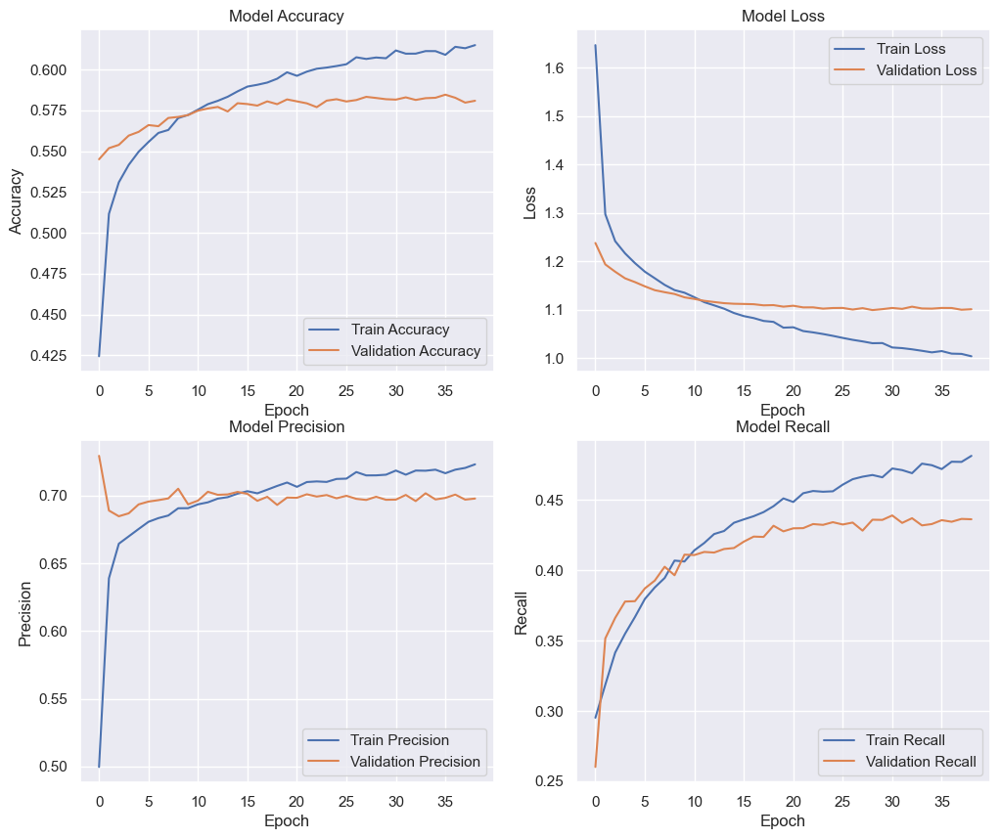

In [35]:
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')


plt.subplot(2, 2, 3)
plt.plot(history.history['precision'], label='Train Precision') 
plt.plot(history.history['val_precision'], label='Validation Precision')  
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 4)
plt.plot(history.history['recall'], label='Train Recall') 
plt.plot(history.history['val_recall'], label='Validation Recall')  
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

The model's accuracy, both in training and validation, improves rapidly at the start and then plateaus, suggesting that the model is learning effectively and achieving stability. The gap between training and validation shows a typical and generally acceptable overfit. Precision and recall both trend upwards over time, demonstrating an improving ability to correctly identify positive cases and a growing accuracy in the model's predictions. Overall, the model exhibits a robust learning curve with balanced performance metrics, indicating a well-tuned training process.

Lets use weights for to classify based on Division/Section level, which is significantly imbalanced.

In [21]:
from sklearn.utils.class_weight import compute_class_weight

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(df['Division/Section'])
y_onehot = to_categorical(y_encoded)

X_train, X_test, y_train, y_test = train_test_split(matrix_reduced, y_onehot, test_size=0.2, random_state=42)

classes = np.unique(y_encoded)
weights = compute_class_weight('balanced', classes=classes, y=y_encoded)
class_weights_dict = {classes[i]: weight for i, weight in enumerate(weights)}

model = Sequential([
    Dense(512, activation='relu', input_dim=X_train.shape[1]),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(y_train.shape[1], activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, save_weights_only=True)

history = model.fit(X_train, y_train, epochs=100, batch_size=256, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint], class_weight=class_weights_dict)

model.load_weights('best_model.h5')

# Evaluate the model on the test data
results = model.evaluate(X_test, y_test, verbose=0)

print(f'Model Test Loss: {results[0]:.4f}')
print(f'Model Test Accuracy: {results[1] * 100:.2f}%')
print(f'Model Test Precision: {results[2]:.4f}')
print(f'Model Test Recall: {results[3]:.4f}')


Epoch 1/100
248/248 [==============================] - 22s 78ms/step - loss: 2.9274 - accuracy: 0.1864 - precision_1: 0.3110 - recall_1: 0.0784 - val_loss: 2.2550 - val_accuracy: 0.3381 - val_precision_1: 0.6188 - val_recall_1: 0.0889
Epoch 2/100
248/248 [==============================] - 19s 75ms/step - loss: 2.2467 - accuracy: 0.2826 - precision_1: 0.4635 - recall_1: 0.1173 - val_loss: 2.1982 - val_accuracy: 0.3453 - val_precision_1: 0.5580 - val_recall_1: 0.1430
Epoch 3/100
248/248 [==============================] - 17s 70ms/step - loss: 2.0887 - accuracy: 0.3118 - precision_1: 0.5063 - recall_1: 0.1290 - val_loss: 2.1496 - val_accuracy: 0.3527 - val_precision_1: 0.5660 - val_recall_1: 0.1475
Epoch 4/100
248/248 [==============================] - 23s 95ms/step - loss: 2.0234 - accuracy: 0.3247 - precision_1: 0.5209 - recall_1: 0.1318 - val_loss: 2.1279 - val_accuracy: 0.3586 - val_precision_1: 0.5577 - val_recall_1: 0.1583
Epoch 5/100
248/248 [==============================] - 22s 9

Epoch 36/100
248/248 [==============================] - 25s 99ms/step - loss: 1.6088 - accuracy: 0.3894 - precision_1: 0.5577 - recall_1: 0.2136 - val_loss: 1.9927 - val_accuracy: 0.3826 - val_precision_1: 0.5454 - val_recall_1: 0.2093
Epoch 37/100
248/248 [==============================] - 19s 75ms/step - loss: 1.6056 - accuracy: 0.3918 - precision_1: 0.5591 - recall_1: 0.2139 - val_loss: 1.9967 - val_accuracy: 0.3835 - val_precision_1: 0.5407 - val_recall_1: 0.2106
Epoch 38/100
248/248 [==============================] - 18s 71ms/step - loss: 1.5943 - accuracy: 0.3934 - precision_1: 0.5617 - recall_1: 0.2154 - val_loss: 2.0105 - val_accuracy: 0.3823 - val_precision_1: 0.5352 - val_recall_1: 0.2115
Epoch 39/100
248/248 [==============================] - 18s 73ms/step - loss: 1.5891 - accuracy: 0.3937 - precision_1: 0.5595 - recall_1: 0.2161 - val_loss: 2.0090 - val_accuracy: 0.3794 - val_precision_1: 0.5400 - val_recall_1: 0.2161
Epoch 40/100
248/248 [==============================] - 

Lets try without weights. Do they really improve the model?

In [22]:
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(df['Division/Section'])
y_onehot = to_categorical(y_encoded)

X_train, X_test, y_train, y_test = train_test_split(matrix_reduced, y_onehot, test_size=0.2, random_state=42)

model = Sequential([
    Dense(512, activation='relu', input_dim=X_train.shape[1]),
    BatchNormalization(),
    Dropout(0.5),
    Dense(256, activation='relu'),
    BatchNormalization(),
    Dropout(0.5),
    Dense(y_train.shape[1], activation='softmax')
])

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, save_weights_only=True)

history = model.fit(X_train, y_train, epochs=100, batch_size=256, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

model.load_weights('best_model.h5')

results = model.evaluate(X_test, y_test, verbose=0)

print(f'Model Test Loss: {results[0]:.4f}')
print(f'Model Test Accuracy: {results[1] *100:.2f}%')
print(f'Model Test Precision: {results[2]:.4f}')
print(f'Model Test Recall: {results[3]:.4f}')

Epoch 1/100
248/248 [==============================] - 18s 67ms/step - loss: 2.7714 - accuracy: 0.2791 - precision_2: 0.4474 - recall_2: 0.1374 - val_loss: 1.9901 - val_accuracy: 0.4119 - val_precision_2: 0.6897 - val_recall_2: 0.1391
Epoch 2/100
248/248 [==============================] - 17s 70ms/step - loss: 2.1327 - accuracy: 0.3717 - precision_2: 0.5682 - recall_2: 0.1689 - val_loss: 1.8864 - val_accuracy: 0.4276 - val_precision_2: 0.6595 - val_recall_2: 0.1919
Epoch 3/100
248/248 [==============================] - 20s 80ms/step - loss: 2.0044 - accuracy: 0.3972 - precision_2: 0.6065 - recall_2: 0.1733 - val_loss: 1.8580 - val_accuracy: 0.4327 - val_precision_2: 0.6617 - val_recall_2: 0.1975
Epoch 4/100
248/248 [==============================] - 16s 66ms/step - loss: 1.9479 - accuracy: 0.4093 - precision_2: 0.6232 - recall_2: 0.1850 - val_loss: 1.8371 - val_accuracy: 0.4387 - val_precision_2: 0.6556 - val_recall_2: 0.2099
Epoch 5/100
248/248 [==============================] - 17s 6

Epoch 36/100
248/248 [==============================] - 27s 108ms/step - loss: 1.6450 - accuracy: 0.4848 - precision_2: 0.6721 - recall_2: 0.2815 - val_loss: 1.7218 - val_accuracy: 0.4712 - val_precision_2: 0.6668 - val_recall_2: 0.2714
Epoch 37/100
248/248 [==============================] - 32s 129ms/step - loss: 1.6414 - accuracy: 0.4843 - precision_2: 0.6722 - recall_2: 0.2823 - val_loss: 1.7214 - val_accuracy: 0.4681 - val_precision_2: 0.6650 - val_recall_2: 0.2684
Epoch 38/100
248/248 [==============================] - 20s 79ms/step - loss: 1.6378 - accuracy: 0.4849 - precision_2: 0.6764 - recall_2: 0.2810 - val_loss: 1.7165 - val_accuracy: 0.4721 - val_precision_2: 0.6662 - val_recall_2: 0.2780
Epoch 39/100
248/248 [==============================] - 16s 66ms/step - loss: 1.6347 - accuracy: 0.4850 - precision_2: 0.6737 - recall_2: 0.2843 - val_loss: 1.7162 - val_accuracy: 0.4709 - val_precision_2: 0.6651 - val_recall_2: 0.2772
Epoch 40/100
248/248 [==============================] 

Despite the conventional wisdom that class weights can mitigate the issues posed by class imbalance by providing a more balanced learning process, the results here indicate a decrease in performance across all evaluated metrics (accuracy, precision, and recall) when class weights were applied. This was somewhat unexpected, as the initial hypothesis was that class weights would enhance the model's ability to generalize across less represented classes, thereby improving overall performance.

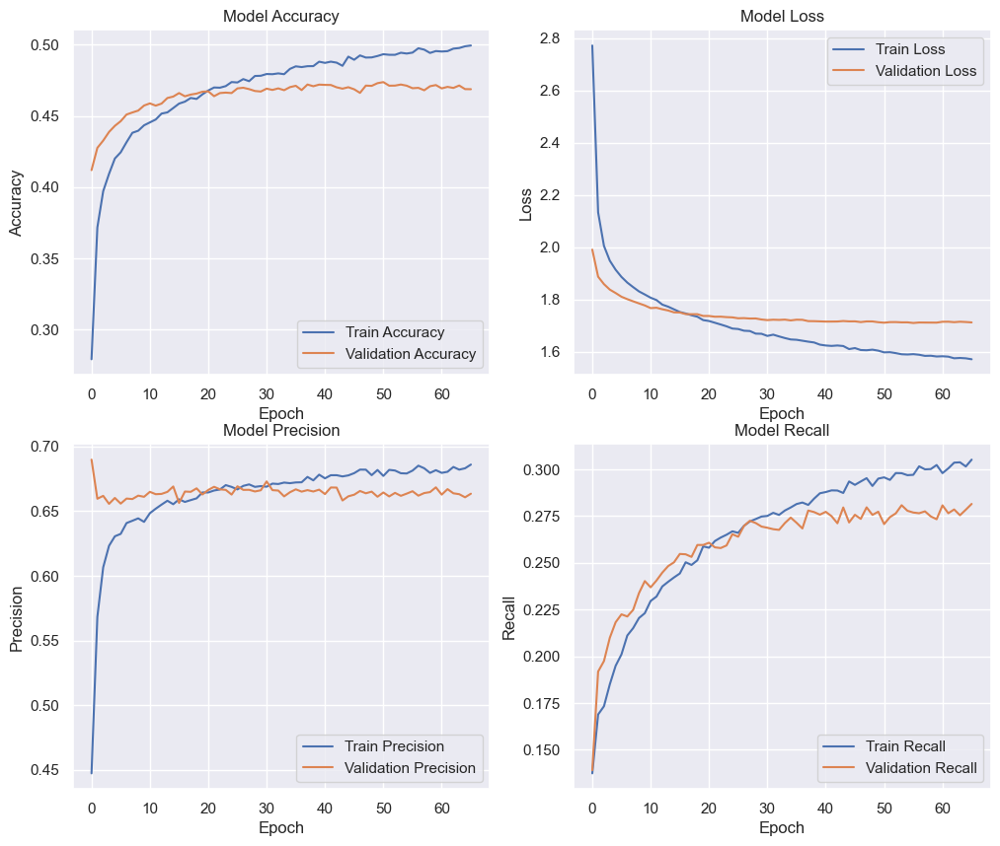

In [25]:
plt.figure(figsize=(12, 10))

plt.subplot(2, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')


plt.subplot(2, 2, 3)
plt.plot(history.history['precision_2'], label='Train Precision') 
plt.plot(history.history['val_precision_2'], label='Validation Precision')  
plt.title('Model Precision')
plt.ylabel('Precision')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

plt.subplot(2, 2, 4)
plt.plot(history.history['recall_2'], label='Train Recall') 
plt.plot(history.history['val_recall_2'], label='Validation Recall')  
plt.title('Model Recall')
plt.ylabel('Recall')
plt.xlabel('Epoch')
plt.legend(loc='lower right')

Similallaly with the classification of Class, the model exhibits a robust learning curve with balanced performance metrics, indicating a well-tuned training process.